# Notebook: ROI → CNN Predictions → Merge → QR-Decoding (Step-by-step)

Ziel: Den kompletten Pipeline-Flow aus `predict_gui_runs.py` nachvollziehbar machen:
1) Bild laden (Original)
2) ROI-Center vorschlagen (C2F) + Patch-Boxen (gelb)
3) Patches extrahieren (Beispiele)
4) Modellrun laden (EfficientNet B0 Transfer)
5) Inference → Patch-Wahrscheinlichkeiten (p)
6) Threshold 0.95: Positive Patches (grün) / Negative (rot)
7) Positive Patch-Boxen via IoU≥0.30 clustern → Merged ROIs
8) Merged ROIs croppen (mit Padding) + Decode-Varianten erzeugen
9) QR-Reader-Kaskade ausführen + Readability-Overlay


## Imports, Repo-Root, Visual-Helpers
**Was passiert schrittweise?**
1. Es werden Standardbibliotheken und die Kernlibs für Bildverarbeitung/Visualisierung geladen: `cv2`, `numpy`, `matplotlib`.
2. `find_repo_root()` läuft vom aktuellen Arbeitsverzeichnis (`Path.cwd()`) nach oben durch die Parent-Ordner und sucht einen Ordner, der wie euer Repo aussieht (enthält z.B. `configs/`, `src/`, `runs/`).
3. `NOTEBOOK_DIR` und `REPO_ROOT` werden gesetzt und zur Kontrolle ausgegeben.
4. `show_rgb()` und `show_gray()` werden definiert, um Bilder konsistent in Jupyter auszugeben:
   - `show_rgb()` konvertiert BGR→RGB (OpenCV liest BGR, matplotlib erwartet RGB) und plottet ohne Achsen.
   - `show_gray()` plottet Graustufen- oder Float-Maps (z.B. Heatmaps) mit Graustufen-Colormap.


In [14]:
from __future__ import annotations

import json
import sys
import math
import importlib.util
from pathlib import Path
from typing import Any, Dict, List, Optional, Tuple

import cv2
import numpy as np
import matplotlib.pyplot as plt


def find_repo_root(start: Path) -> Path:
    start = start.resolve()
    for p in [start] + list(start.parents):
        if (p / "configs").exists() and (p / "src").exists() and (p / "runs").exists():
            return p
    return start.parent.resolve()


NOTEBOOK_DIR = Path.cwd()
REPO_ROOT = find_repo_root(NOTEBOOK_DIR)

def show_rgb(img_bgr: np.ndarray, title: str, figsize=(12, 7)):
    rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=figsize)
    plt.imshow(rgb)
    plt.title(title)
    plt.axis("off")
    plt.show()

def show_gray(img_u8_or_f: np.ndarray, title: str, figsize=(12, 7)):
    plt.figure(figsize=figsize)
    plt.imshow(img_u8_or_f, cmap="gray")
    plt.title(title)
    plt.axis("off")
    plt.show()

print("NOTEBOOK_DIR:", NOTEBOOK_DIR)
print("REPO_ROOT:", REPO_ROOT)


NOTEBOOK_DIR: /Users/timschafer/Documents/Masterstudium/2. Semester/Künstliche Intelligenz/QR_Code_Windshield/qr-code-windshield-cnn/notebooks
REPO_ROOT: /Users/timschafer/Documents/Masterstudium/2. Semester/Künstliche Intelligenz/QR_Code_Windshield/qr-code-windshield-cnn


## Script-Modul laden (predict_gui_runs.py) ohne GUI zu starten
**Was passiert schrittweise?**
1. Der Pfad `scripts/predict_gui_runs.py` wird über `REPO_ROOT` konstruiert.
2. Über `importlib.util.spec_from_file_location(...)` wird eine Modul-Spec erzeugt, damit wir das Script wie ein Python-Modul laden können.
3. Das Modul-Objekt wird erstellt (`module_from_spec`) und der Loader führt den Code aus (`exec_module`).
4. Danach steht das gesamte Script als `pgr` zur Verfügung, d.h. wir können Funktionen wie `iter_image_files`, `load_model_from_run`, `draw_boxes`, etc. direkt benutzen – ohne die Tkinter-GUI zu starten.


In [15]:
import importlib.util
import sys
from pathlib import Path

SCRIPT_PATH = REPO_ROOT / "scripts" / "predict_gui_runs.py"
assert SCRIPT_PATH.exists(), f"Script not found: {SCRIPT_PATH}"

# Nutze einen eindeutigen Modulnamen, damit es keine Kollisionen gibt
MODULE_NAME = "predict_gui_runs_nb"

# Falls ein vorheriger (fehlgeschlagener) Import im Kernel hängt, entfernen:
if MODULE_NAME in sys.modules:
    del sys.modules[MODULE_NAME]

spec = importlib.util.spec_from_file_location(MODULE_NAME, SCRIPT_PATH)
if spec is None or spec.loader is None:
    raise ImportError(f"Could not create spec for: {SCRIPT_PATH}")

pgr = importlib.util.module_from_spec(spec)

# WICHTIG: Registrierung in sys.modules VOR exec_module, sonst dataclass-Fehler
sys.modules[MODULE_NAME] = pgr

spec.loader.exec_module(pgr)

print("Loaded module:", MODULE_NAME, "from:", SCRIPT_PATH)


Loaded module: predict_gui_runs_nb from: /Users/timschafer/Documents/Masterstudium/2. Semester/Künstliche Intelligenz/QR_Code_Windshield/qr-code-windshield-cnn/scripts/predict_gui_runs.py


## Parameter setzen (Run, Threshold=0.95, IoU=0.30) + Pfade
**Was passiert schrittweise?**
1. Die fest geforderten Parameter werden gesetzt:
   - `RUN_DIRNAME = "2026-01-12_001051_transfer_efficientnet_b0"`
   - `THRESH = 0.95` (CNN-Threshold)
   - `MERGE_IOU = 0.30` (IoU-Schwelle fürs Mergen)
2. Der Input-Pfad wird gesetzt (standardmäßig `data/raw`), kann aber auch auf ein einzelnes Bild zeigen.
3. Der Pfad zur ROI-Config (`configs/roi_tuner_params.json`) wird gesetzt.
4. Zwei Run-Root-Verzeichnisse werden festgelegt:
   - Default `runs/cnn_scratch`
   - Fallback `runs/` (falls deine Runs anders abgelegt sind)
5. Performance-/Debug-Parameter werden gesetzt (`MAX_PATCHES`, `BATCH_SIZE`, `DEVICE`).
6. Alle Werte werden ausgegeben, damit sofort klar ist, welche Einstellungen gelten.


In [16]:
RUN_DIRNAME = "2026-01-12_001051_transfer_efficientnet_b0"
# RUN_DIRNAME = "2026-01-05_111844_lr_3e-4"
# RUN_DIRNAME = "2025-12-17_231714_baseline"
# RUN_DIRNAME = "2025-12-21_135540_baseline"

THRESH = 0.95
MERGE_IOU = 0.30

INPUT_PATH = REPO_ROOT / "data" / "raw"  # oder setze hier ein einzelnes Bild
ROI_CONFIG_PATH = REPO_ROOT / "configs" / "roi_tuner_params.json"

# Standard wie im Script: runs/cnn_scratch
RUNS_DIR_DEFAULT = REPO_ROOT / "runs" / "cnn_scratch"
# Fallback: falls dein Run woanders liegt, suchen wir notfalls in runs/*
RUNS_DIR_FALLBACK = REPO_ROOT / "runs"

MAX_PATCHES = 200
BATCH_SIZE = 64
DEVICE = "auto"

print("RUN_DIRNAME:", RUN_DIRNAME)
print("THRESH:", THRESH)
print("MERGE_IOU:", MERGE_IOU)
print("INPUT_PATH:", INPUT_PATH)
print("ROI_CONFIG_PATH:", ROI_CONFIG_PATH)
print("RUNS_DIR_DEFAULT:", RUNS_DIR_DEFAULT)


RUN_DIRNAME: 2026-01-12_001051_transfer_efficientnet_b0
THRESH: 0.95
MERGE_IOU: 0.3
INPUT_PATH: /Users/timschafer/Documents/Masterstudium/2. Semester/Künstliche Intelligenz/QR_Code_Windshield/qr-code-windshield-cnn/data/raw
ROI_CONFIG_PATH: /Users/timschafer/Documents/Masterstudium/2. Semester/Künstliche Intelligenz/QR_Code_Windshield/qr-code-windshield-cnn/configs/roi_tuner_params.json
RUNS_DIR_DEFAULT: /Users/timschafer/Documents/Masterstudium/2. Semester/Künstliche Intelligenz/QR_Code_Windshield/qr-code-windshield-cnn/runs/cnn_scratch


## Bild auswählen + Original anzeigen (Output 1)
**Was passiert schrittweise?**
1. `pgr.iter_image_files(INPUT_PATH)` sammelt alle Bilddateien (oder nimmt genau eine Datei, wenn `INPUT_PATH` eine Datei ist).
2. Falls keine Bilder gefunden werden: Fehler – damit du sofort weißt, dass Pfad/Dateien nicht stimmen.
3. Das erste Bild wird gewählt (`IMAGE_PATH = img_paths[0]`) und mit OpenCV eingelesen.
4. Das Originalbild wird geplottet (`show_rgb`) als Referenz für alle späteren Overlays (Boxes, Readability).


Using IMAGE_PATH: /Users/timschafer/Documents/Masterstudium/2. Semester/Künstliche Intelligenz/QR_Code_Windshield/qr-code-windshield-cnn/data/testimages/IMG_6908.jpg


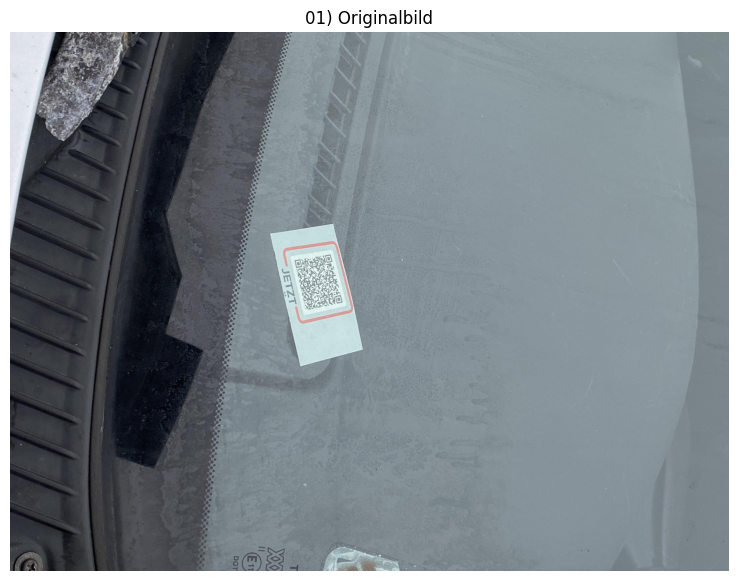

In [17]:
img_paths = list(pgr.iter_image_files(Path(INPUT_PATH)))
if not img_paths:
    raise FileNotFoundError(f"No images found in: {INPUT_PATH}")

# IMAGE_PATH = img_paths[0]
IMAGE_PATH = REPO_ROOT / "data" / "testimages" / "IMG_6908.jpg"
img_bgr = cv2.imread(str(IMAGE_PATH), cv2.IMREAD_COLOR)
if img_bgr is None:
    raise ValueError(f"Could not read image: {IMAGE_PATH}")

print("Using IMAGE_PATH:", IMAGE_PATH)
show_rgb(img_bgr, "01) Originalbild")


## ROI Config laden + Centers vorschlagen (C2F) + gelbe Patch-Boxen (Output 2)
**Was passiert schrittweise?**
1. `pgr.load_roi_config(ROI_CONFIG_PATH)` lädt die ROI-Tuning-Parameter (Patch-Größe, Sliding-Window/Scoring-Parameter etc.).
2. `pgr.propose_centers_c2f(img_bgr, roi_cfg)` führt die Coarse-to-Fine ROI-Suche aus:
   - erstellt eine interne Score-Map (z.B. Struktur/Gradient/… je nach Implementierung im Script)
   - scannt mit Sliding Windows und verfeinert lokal
   - liefert eine Liste von Patch-Zentren (cx, cy) im Originalbildraum
3. Es wird auf `MAX_PATCHES` begrenzt, um Debugging schnell zu halten.
4. `pgr.draw_patch_boxes(...)` zeichnet um jedes Center ein Quadrat der Größe `patch_size` und färbt es gelb.
5. Das Overlay wird angezeigt, damit du siehst, wo überhaupt Patches extrahiert werden.


ROI config loaded. patch_size = 265
Proposed centers: 200


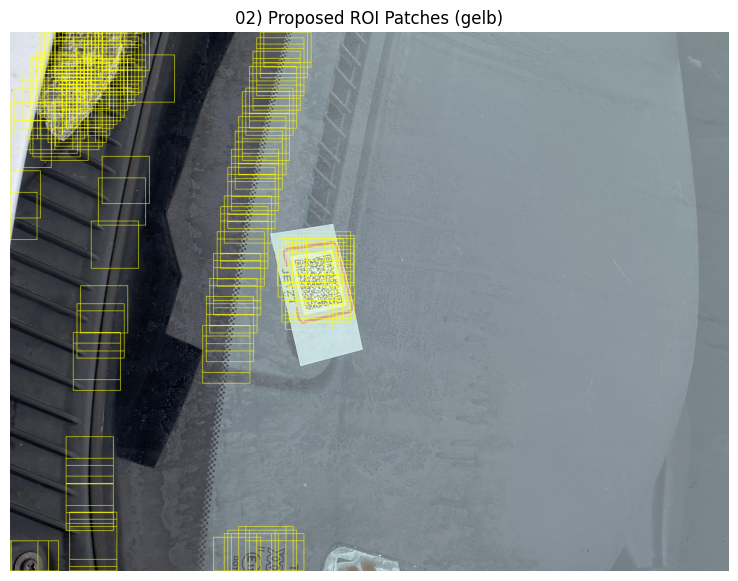

In [18]:
roi_cfg = pgr.load_roi_config(Path(ROI_CONFIG_PATH))
print("ROI config loaded. patch_size =", int(roi_cfg.patch_size))

centers = pgr.propose_centers_c2f(img_bgr, roi_cfg)[:MAX_PATCHES]
print("Proposed centers:", len(centers))

img_rois = pgr.draw_patch_boxes(img_bgr, centers, int(roi_cfg.patch_size), color=(0, 255, 255), thickness=2)
show_rgb(img_rois, "02) Proposed ROI Patches (gelb)")


## Patches extrahieren + 2–4 Beispielpatches anzeigen (Output 3)
**Was passiert schrittweise?**
1. Für jedes vorgeschlagene Center (cx, cy) wird ein Patch ausgeschnitten:
   - `pgr.pad_and_crop(...)` macht dabei “sicheren Crop”: falls der Patch am Rand liegt, wird gepadded statt abgeschnitten.
2. Alle Patches werden in einer Liste gesammelt (`patches`).
3. Es werden 2–4 Beispielpatches geplottet:
   - Das ist wichtig, weil exakt diese Patches später in das CNN gehen.
   - Du siehst dadurch sofort, ob die ROI-Vorschläge sinnvoll sind (QR-Struktur drin? zu viel Hintergrund?).


Extracted patches: 200


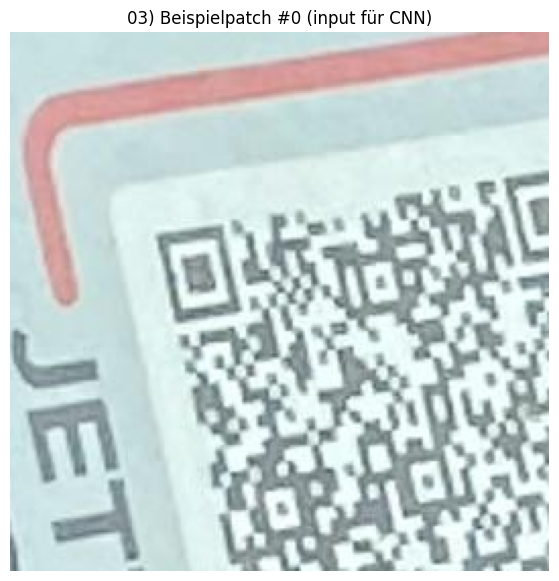

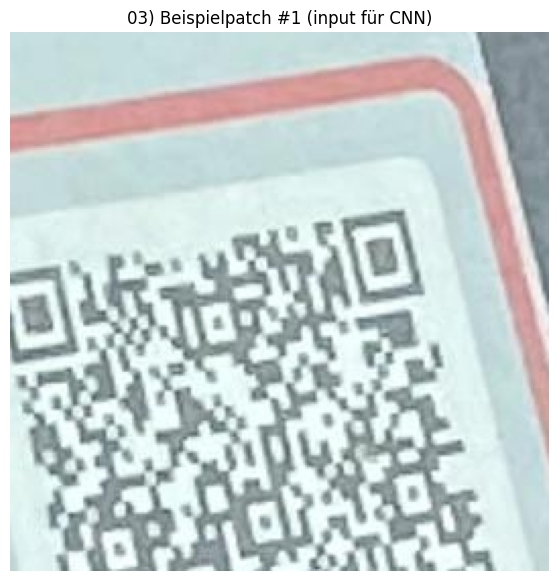

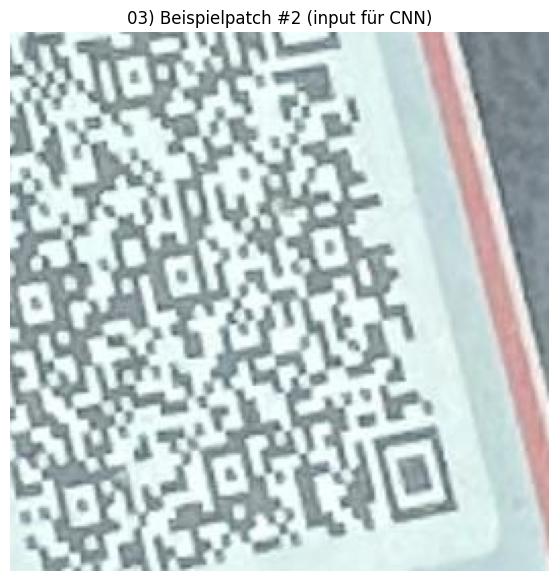

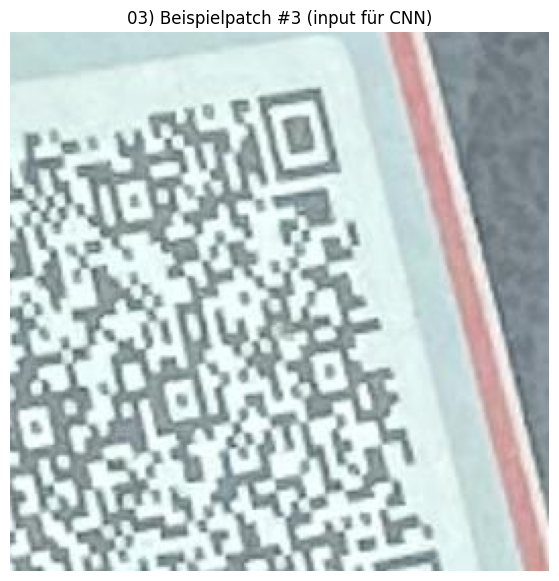

In [19]:
patches: List[np.ndarray] = []
for c in centers:
    cx, cy = int(c["cx"]), int(c["cy"])
    patch = pgr.pad_and_crop(img_bgr, cx, cy, int(roi_cfg.patch_size))
    patches.append(patch)

print("Extracted patches:", len(patches))

for i in range(min(4, len(patches))):
    show_rgb(patches[i], f"03) Beispielpatch #{i} (input für CNN)")


## Eigene CNN-Netwerkarchitektur

<img src="/Users/timschafer/Documents/Masterstudium/2. Semester/Künstliche Intelligenz/QR_Code_Windshield/qr-code-windshield-cnn/docs/LaTeX/Figures/tikz2pdf/tinyQRnet/network_arch.png" alt="Mercedes foam" width="750">


## Runs finden + exakt den gewünschten Run laden (EfficientNet B0)
**Was passiert schrittweise?**
1. Es wird versucht, Runs im Default-Verzeichnis (`runs/cnn_scratch`) zu finden (`pgr.discover_runs`).
2. Falls dort nichts gefunden wird, wird ein Fallback-Suchlauf unter `runs/*` gemacht.
3. Die gefundenen Runs werden nach dem gewünschten Ordnernamen `RUN_DIRNAME` gefiltert.
4. Wenn der Run nicht gefunden wird:
   - werden die verfügbaren Run-Namen ausgegeben (Debug-Hilfe)
   - danach wird ein Fehler geworfen.
5. `pgr.load_model_from_run(run, DEVICE)` lädt:
   - den Checkpoint (typisch: `best.pt`)
   - rekonstruiert Modelltyp/Architektur (hier EfficientNet B0 Transfer)
   - lädt Normalisierung (`mean/std`), `input_size`, Device
6. Diese Infos werden ausgegeben, damit klar ist, wie die Preprocessing-Schritte aussehen und worauf das Modell trainiert wurde.


In [20]:
def discover_runs_multi() -> List[pgr.ModelRun]:
    runs = pgr.discover_runs(Path(RUNS_DIR_DEFAULT))
    if runs:
        return runs
    # fallback: scannt nur eine Ebene unter runs/
    all_runs = []
    for d in sorted(Path(RUNS_DIR_FALLBACK).iterdir()):
        if d.is_dir():
            all_runs.extend(pgr.discover_runs(d))
    return all_runs

runs = discover_runs_multi()
if not runs:
    raise FileNotFoundError("No runs found under runs/ (no best.pt).")

run = None
for r in runs:
    if r.run_dir.name == RUN_DIRNAME:
        run = r
        break

if run is None:
    # hilfreiche Debug-Ausgabe
    print("Available run_dir names:")
    for r in runs[:40]:
        print(" -", r.run_dir.name)
    raise ValueError(f"Requested run not found: {RUN_DIRNAME}")

loaded = pgr.load_model_from_run(run, DEVICE)

print("Loaded run:", run.run_dir)
print("Model kind:", loaded.kind)
print("Model input_size:", loaded.input_size)
print("Normalize mean:", loaded.mean)
print("Normalize std :", loaded.std)
print("Device:", loaded.device)


Loaded run: /Users/timschafer/Documents/Masterstudium/2. Semester/Künstliche Intelligenz/QR_Code_Windshield/qr-code-windshield-cnn/runs/cnn_scratch/2026-01-12_001051_transfer_efficientnet_b0
Model kind: transfer
Model input_size: 224
Normalize mean: [0.485, 0.456, 0.406]
Normalize std : [0.229, 0.224, 0.225]
Device: mps


## Inference: Patches → Tensor → Probabilities (Output 4)
**Was passiert schrittweise?**
1. Das Notebook nutzt `torch.no_grad()`, damit keine Gradienten berechnet werden (schneller/ weniger RAM).
2. Die Patches werden in Batches durchlaufen (BATCH_SIZE), um GPU/CPU effizient zu nutzen.
3. `pgr.patches_to_tensor(...)` macht das komplette Modell-Preprocessing:
   - Resize auf `loaded.input_size`
   - ggf. BGR→RGB
   - Skalierung auf [0..1]
   - Normalisierung mit `loaded.mean/std`
   - Umformatierung zu CHW + Batch-Stacking
   - Tensor auf das richtige Device
4. Das Modell läuft vorwärts: `y = m(x)`.
5. `pgr.probs_from_logits(y)` wandelt Logits in Wahrscheinlichkeiten `p` um (typisch: sigmoid bei binary).
6. Es werden Statistiken ausgegeben (min/max/mean) und gezählt, wie viele Patches `p>=0.95` sind.
7. Ein Histogramm zeigt die Verteilung der Scores – sehr hilfreich, um zu sehen, ob das Modell “klar trennt” oder unsicher ist.


Computed probs: 200
p stats: min/max/mean = 1.9373104805708863e-05 0.999998927116394 0.18568237744617364
positives (p>=0.95): 36


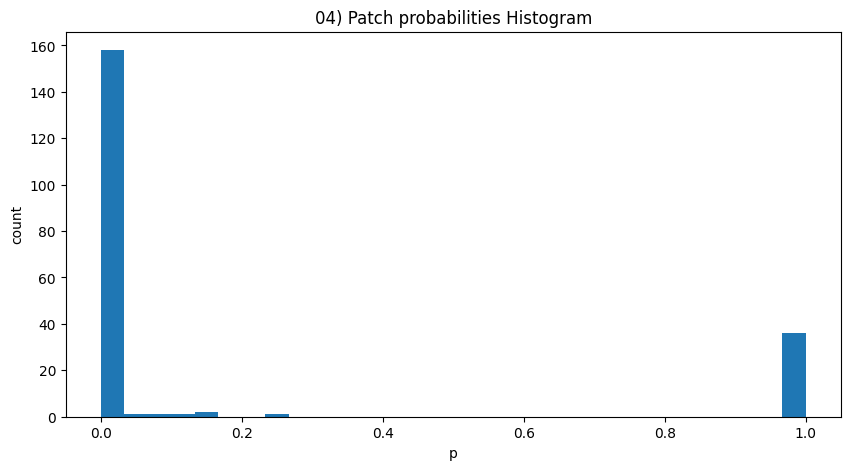

In [21]:
import torch  # wird im Script erwartet

probs_all: List[float] = []
m = loaded.model
dev = loaded.device

with torch.no_grad():
    for start in range(0, len(patches), BATCH_SIZE):
        batch = patches[start:start+BATCH_SIZE]
        x = pgr.patches_to_tensor(batch, loaded.input_size, loaded.mean, loaded.std, dev)
        y = m(x)
        probs = pgr.probs_from_logits(y)
        probs_all.extend([float(p) for p in probs.tolist()])

probs_all = probs_all[:len(patches)]
print("Computed probs:", len(probs_all))
print("p stats: min/max/mean =", np.min(probs_all), np.max(probs_all), np.mean(probs_all))
print("positives (p>=0.95):", int(np.sum(np.array(probs_all) >= THRESH)))

plt.figure(figsize=(10,5))
plt.hist(probs_all, bins=30)
plt.title("04) Patch probabilities Histogram")
plt.xlabel("p")
plt.ylabel("count")
plt.show()


## Prediction-Overlay: Rot/Grün + p-Werte (Output 5)
**Was passiert schrittweise?**
1. Es wird ein Overlay-Image gebaut, das alle Patch-Boxen zeigt.
2. Für jedes Patch:
   - wenn `p >= THRESH`: Box wird grün gezeichnet
   - sonst: Box wird rot gezeichnet
3. Zusätzlich wird der p-Wert als Text in/bei die Box geschrieben.
4. Output: Ein Bild, das dir direkt zeigt, welche ROI-Vorschläge vom CNN “akzeptiert” werden und welche nicht.


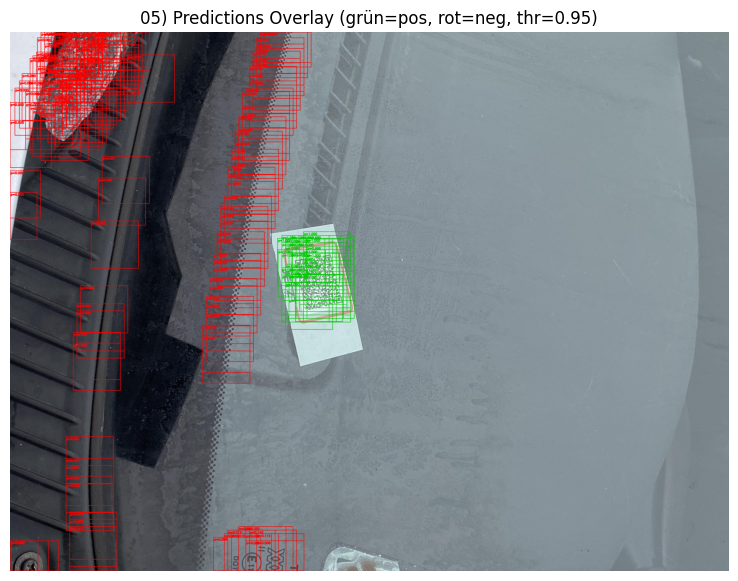

In [22]:
img_pred = pgr.draw_patch_boxes_with_probs(
    img_bgr,
    centers,
    probs_all,
    int(roi_cfg.patch_size),
    thr=THRESH,
)
show_rgb(img_pred, "05) Predictions Overlay (grün=pos, rot=neg, thr=0.95)")


## Positive Patch-Boxen bauen + IoU-Clustering (IoU≥0.30) (Output 6)
**Was passiert schrittweise?**
1. Es werden nur positive Patches (p>=0.95) genommen.
2. Zu jedem positiven Patch wird eine Box im Originalbild berechnet (patch_size um das Center).
3. `pgr.clamp_box(...)` stellt sicher, dass Box-Koordinaten im Bild bleiben.
4. Aus den positiven Boxen wird eine Liste `PatchBox` gebaut (enthält idx, box, p).
5. `pgr.cluster_boxes_by_iou(pos_boxes, iou_thr=0.30)` clustert Boxen:
   - Boxen gehören zusammen, wenn sie genügend überlappen (IoU≥0.30)
   - Ergebnis sind Merged-Objekte mit:
     - Union-Box
     - Mitglieder-Liste
     - Cluster-Score (z.B. max(p) oder ähnlich)
6. Output: Anzahl positiver Patches, Anzahl Merged ROIs, und eine kurze Übersicht der Top-Cluster (Score, Mitglieder, Box).


In [23]:
h, w = img_bgr.shape[:2]
ps = int(roi_cfg.patch_size)
half = ps // 2

pos_boxes: List[pgr.PatchBox] = []
for i, (c, p) in enumerate(zip(centers, probs_all)):
    if float(p) < THRESH:
        continue
    cx, cy = int(c["cx"]), int(c["cy"])
    x0, y0 = cx - half, cy - half
    x1, y1 = x0 + ps, y0 + ps
    x0, y0, x1, y1 = pgr.clamp_box(x0, y0, x1, y1, w, h)
    pos_boxes.append(pgr.PatchBox(idx=i, box=(x0, y0, x1, y1), p=float(p)))

merged = pgr.cluster_boxes_by_iou(pos_boxes, iou_thr=MERGE_IOU)

print("Positive patches:", len(pos_boxes))
print("Merged ROIs:", len(merged))
for i, m in enumerate(merged[:10]):
    print(f"{i:02d} score={m.score:.3f} members={len(m.members)} box={m.box}")


Positive patches: 36
Merged ROIs: 1
00 score=1.000 members=36 box=(1500, 1120, 1930, 1668)


## Merged ROIs auf Originalbild zeichnen + 1–2 Crops anzeigen (Output 7)
**Was passiert schrittweise?**
1. Es werden die Union-Boxen der Merged ROIs gesammelt.
2. Labels werden erzeugt (z.B. `#i score=... members=...`) für Debugging.
3. `pgr.draw_boxes(...)` zeichnet die Merged ROI-Boxen auf das Originalbild:
   - optional wird das “beste” ROI gehighlighted (highlight_idx=0)
4. Zusätzlich wird für 1–2 Merged ROIs ein Crop erzeugt:
   - vorher wird die Box leicht vergrößert (`expand_box`) um “quiet zone”/Rand mit einzubeziehen
   - dann wird ausgeschnitten (`crop_bgr`)
5. Output: Overlay + Crop-Preview, um zu prüfen, ob das Mergen sinnvolle QR-Regionen erzeugt.


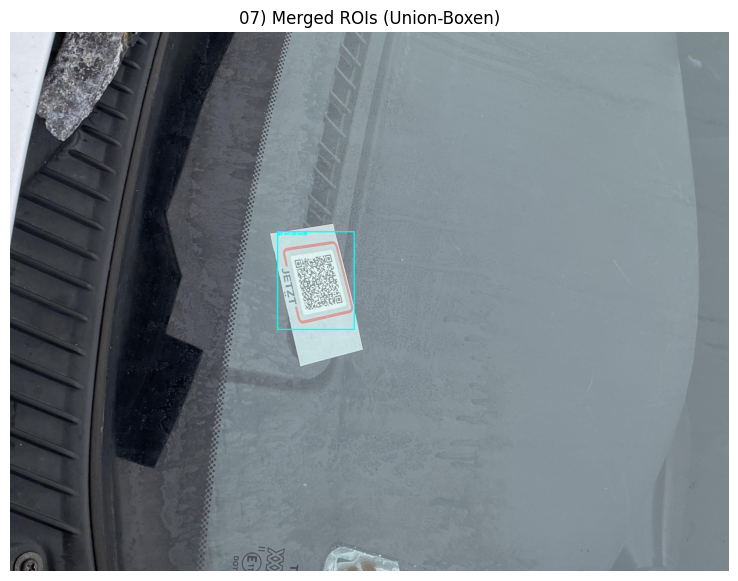

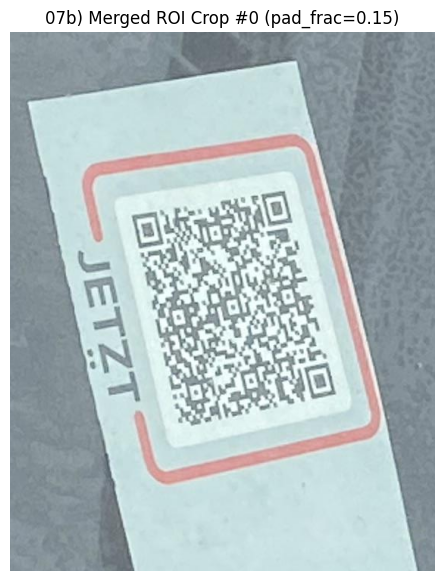

In [24]:
boxes = [m.box for m in merged]
labels = [f"#{i} s={m.score:.2f} n={len(m.members)}" for i, m in enumerate(merged)]
img_merged = pgr.draw_boxes(img_bgr, boxes, color=(255, 255, 0), thickness=3, labels=labels, highlight_idx=0)
show_rgb(img_merged, "07) Merged ROIs (Union-Boxen)")

# Crop-Preview: wie im Script mit Padding ("quiet zone")
DECODE_PAD_FRAC = 0.15
for i in range(min(2, len(merged))):
    box_pad = pgr.expand_box(merged[i].box, DECODE_PAD_FRAC, w, h)
    crop = pgr.crop_bgr(img_bgr, box_pad)
    show_rgb(crop, f"07b) Merged ROI Crop #{i} (pad_frac={DECODE_PAD_FRAC})")


## Decode-Varianten + QR-Reader-Kaskade + Readability-Overlay (Output 8)
**Was passiert schrittweise?**
1. `pgr.QRReaders()` wird instanziiert. Das Objekt kapselt mehrere Decoder:
   - OpenCV
   - optional pyzbar / zxingcpp / pyquirc (abhängig von Installation)
2. `available_readers()` listet, welche Reader tatsächlich verfügbar sind (Debug).
3. Für jede Merged ROI:
   - Box wird gepadded (`expand_box`), dann crop (`crop_bgr`)
   - `readers.decode_all(crop)` versucht mehrere Varianten/Reader:
     - je nach Script: raw, gray, upscaled, adaptive threshold, etc.
   - Ergebnis pro Reader wird gesammelt (`ok`, `text`, `error`, `variant`)
4. `readable = any(rr.ok)` setzt ein Flag: ROI ist decodierbar, wenn irgendein Reader Erfolg hat.
5. Es wird ein textuelles Ergebnis-Log ausgegeben:
   - für jedes Merged ROI: Score, Mitglieder, Box
   - pro Reader: OK/FAIL + (ggf.) decodierter Text oder Error
6. Zum Schluss wird ein Readability-Overlay gezeichnet:
   - grün für decodierbar
   - rot für nicht decodierbar
   - optional highlight der Top-ROI
7. Output: sehr schnell sichtbar, ob das Modell+ROI-Merge in echte, decodierbare QR-Crops mündet.

Reader availability: {'opencv': True, 'pyzbar': True, 'zxingcpp': True, 'pyquirc': True}

Merged #0 | score=1.000 | members=36 | box=(1500, 1120, 1930, 1668) | READABLE=1
  - opencv  : OK   [raw]      https://www.apotheken-umschau.de/podcast/serie/siege-der-medizin-der-medizinh...
  - pyzbar  : OK   [raw]      https://www.apotheken-umschau.de/podcast/serie/siege-der-medizin-der-medizinh...
  - zxingcpp: OK   [raw]      https://www.apotheken-umschau.de/podcast/serie/siege-der-medizin-der-medizinh...
  - pyquirc : OK   [raw]      https://www.apotheken-umschau.de/podcast/serie/siege-der-medizin-der-medizinh...


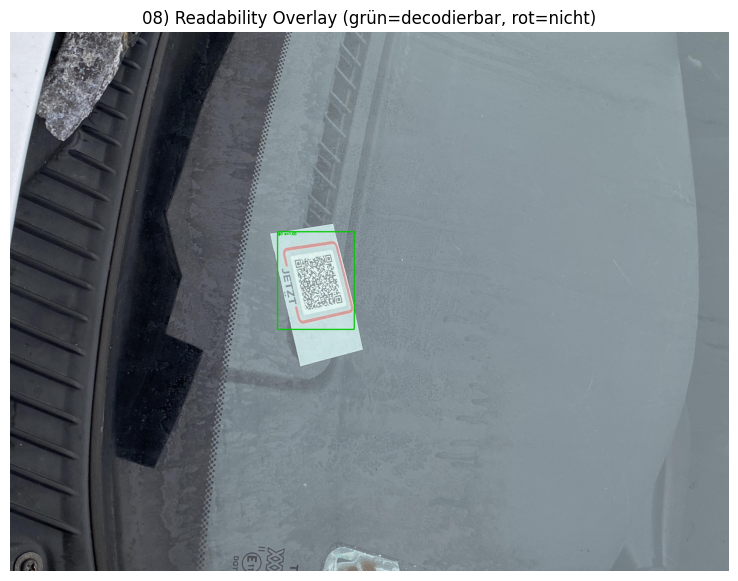

In [25]:
readers = pgr.QRReaders()
avail = readers.available_readers()
print("Reader availability:", avail)

decode_results: Dict[int, Dict[str, pgr.ReaderResult]] = {}
readable_flags: List[bool] = []

for i, m in enumerate(merged):
    box_pad = pgr.expand_box(m.box, DECODE_PAD_FRAC, w, h)
    crop = pgr.crop_bgr(img_bgr, box_pad)

    res = readers.decode_all(crop)
    decode_results[i] = res
    readable = any(rr.ok for rr in res.values())
    readable_flags.append(readable)

# Textuelle Ausgabe (kompakt)
def trunc(s: str, n: int = 80) -> str:
    s = (s or "").replace("\n", " ")
    return s if len(s) <= n else (s[:n-3] + "...")

for i in range(len(merged)):
    m = merged[i]
    print(f"\nMerged #{i} | score={m.score:.3f} | members={len(m.members)} | box={m.box} | READABLE={int(readable_flags[i])}")
    res = decode_results[i]
    for rn in readers.reader_names:
        rr = res.get(rn)
        if rr is None:
            continue
        status = "OK" if rr.ok else "FAIL"
        tag = f"[{rr.variant}]" if rr.variant else ""
        txt = trunc(rr.text)
        if rr.error:
            txt = rr.error
        print(f"  - {rn:8s}: {status:4s} {tag:10s} {txt}")

# Overlay readability auf Original
boxes = [m.box for m in merged]
labels = [f"#{i} s={m.score:.2f}" for i, m in enumerate(merged)]
img_read = pgr.draw_boxes_readability(img_bgr, boxes, readable_flags, highlight_idx=0, labels=labels)
show_rgb(img_read, "08) Readability Overlay (grün=decodierbar, rot=nicht)")


Grad-CAM uses model (CPU): 2026-01-12_001051_transfer_efficientnet_b0
kind: transfer | input_size: 224
QR-patches: 36 | showing top 6
Grad-CAM target conv layer: features.8.0
Last adaptive pool: avgpool

Patch rank #0 | idx=5 | p=1.0000 | center=(1676,1293) | box=(1544, 1161, 1809, 1426)


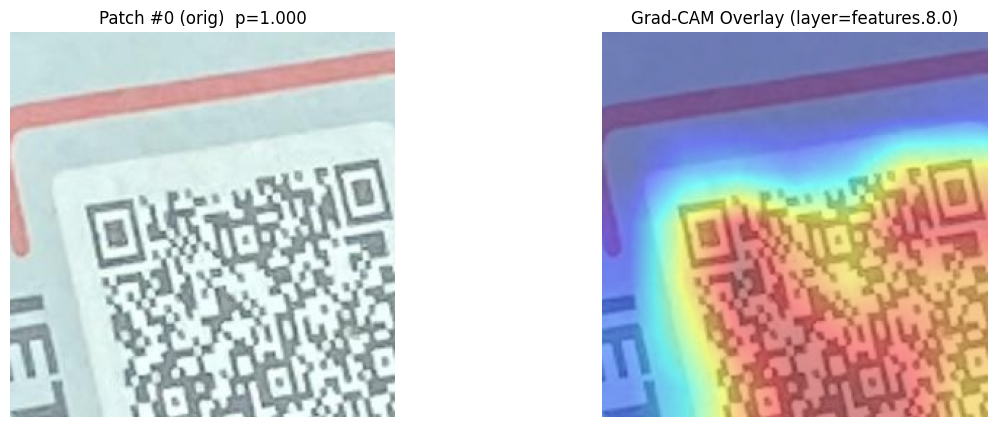

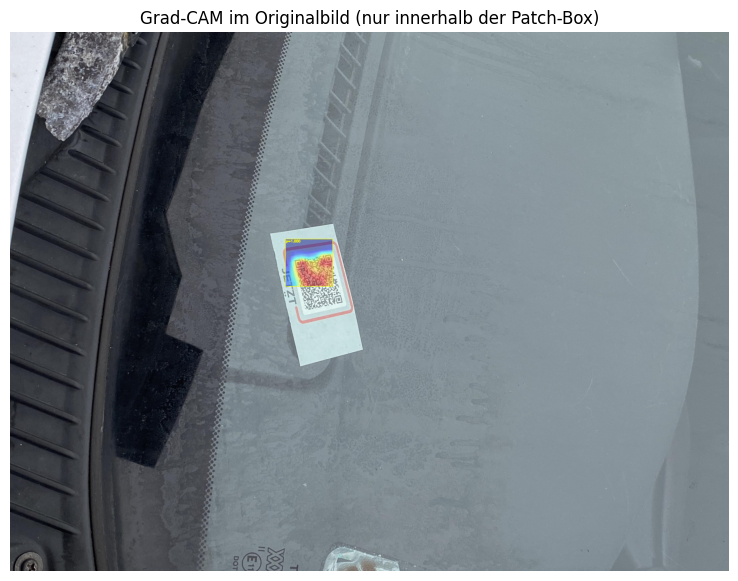


Patch rank #1 | idx=25 | p=1.0000 | center=(1676,1434) | box=(1544, 1302, 1809, 1567)


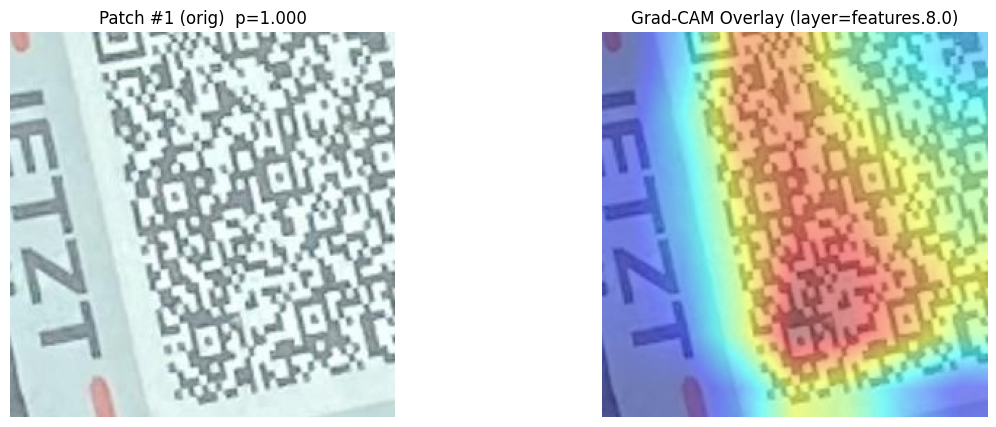

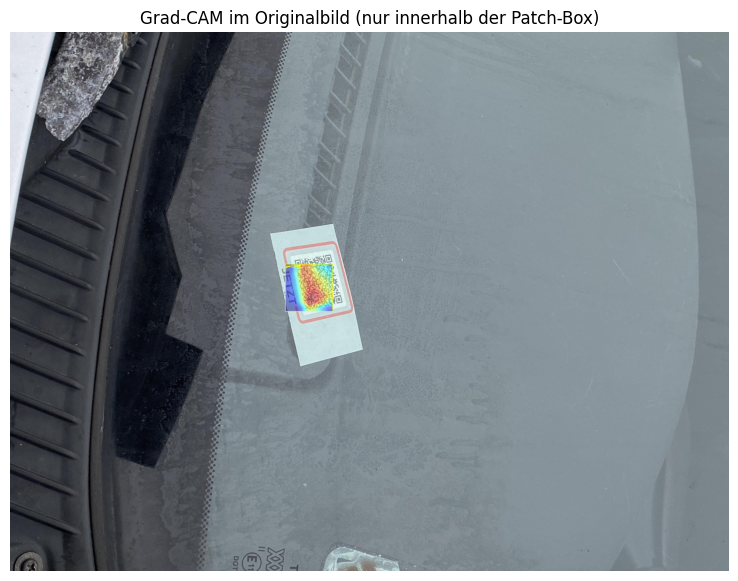


Patch rank #2 | idx=18 | p=1.0000 | center=(1696,1313) | box=(1564, 1181, 1829, 1446)


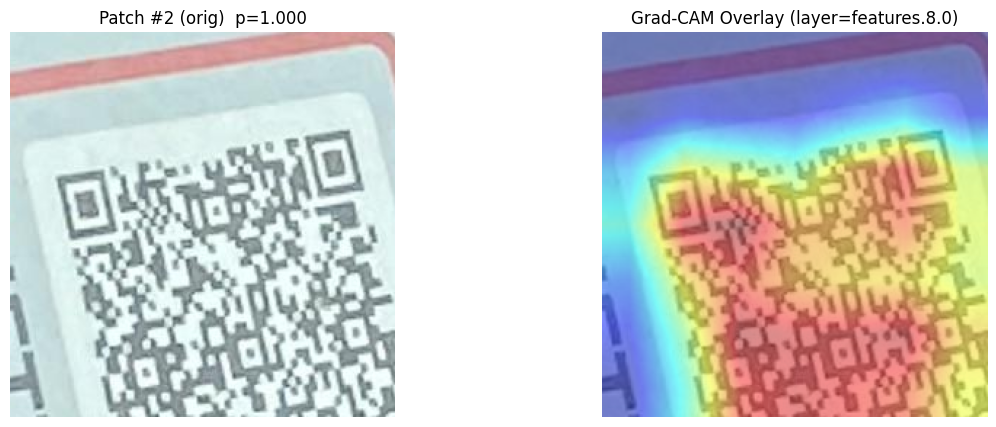

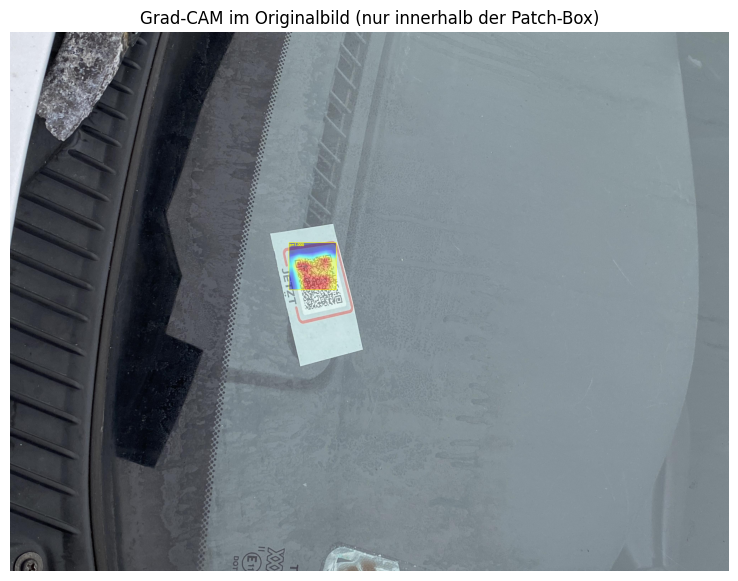


Patch rank #3 | idx=121 | p=1.0000 | center=(1656,1273) | box=(1524, 1141, 1789, 1406)


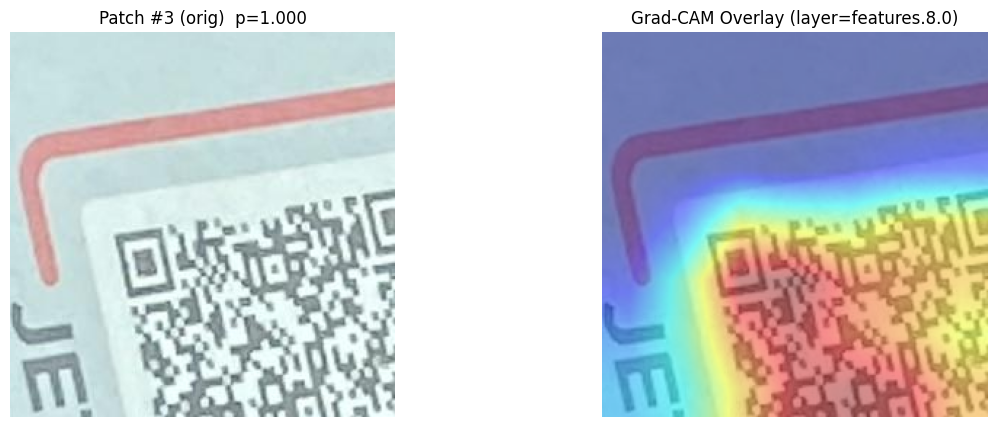

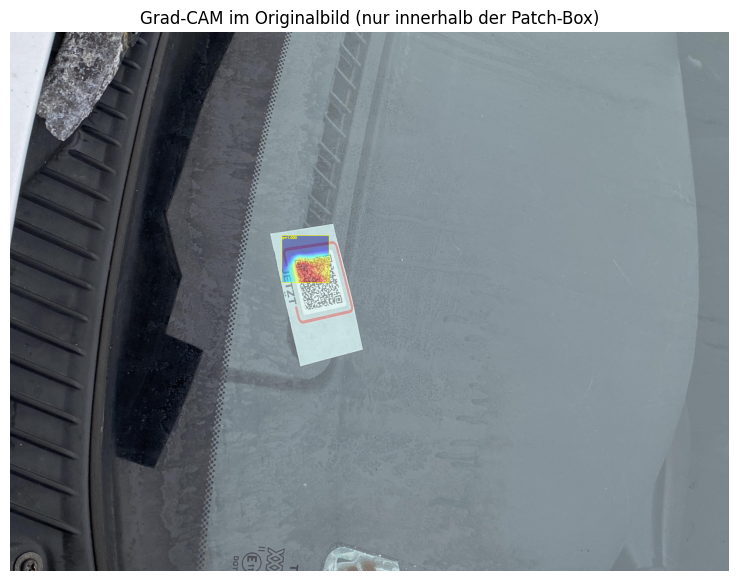


Patch rank #4 | idx=45 | p=1.0000 | center=(1732,1491) | box=(1600, 1359, 1865, 1624)


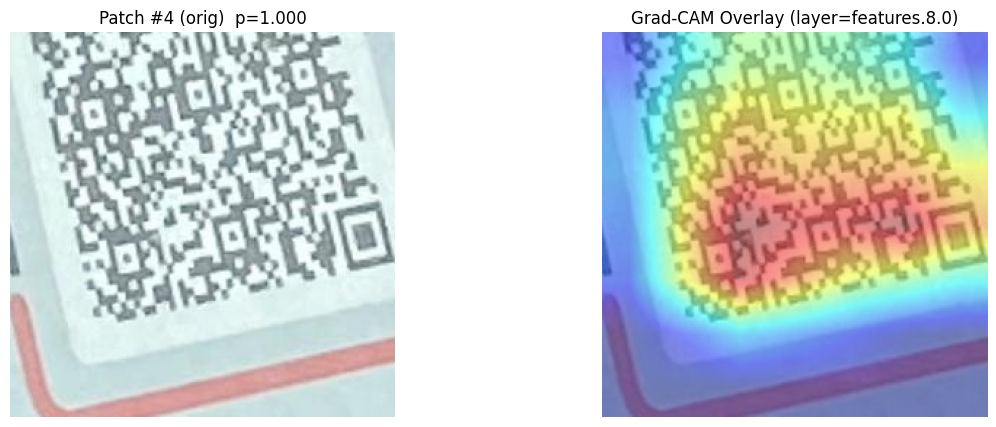

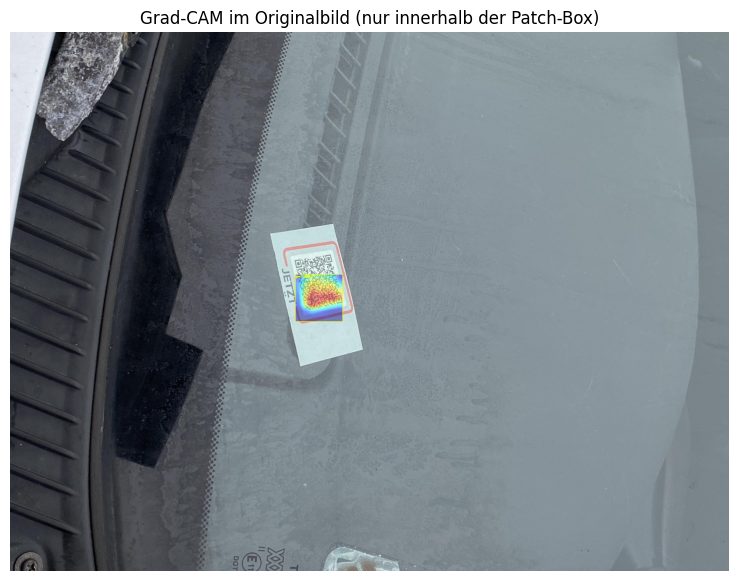


Patch rank #5 | idx=27 | p=1.0000 | center=(1712,1370) | box=(1580, 1238, 1845, 1503)


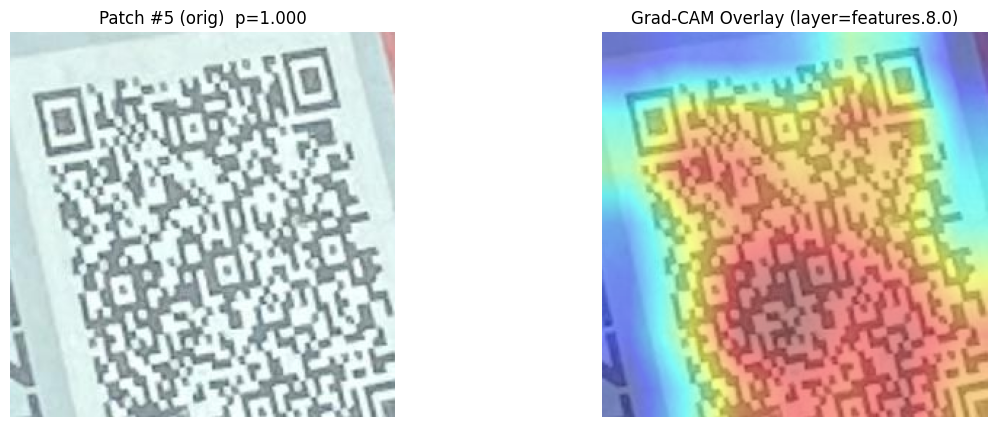

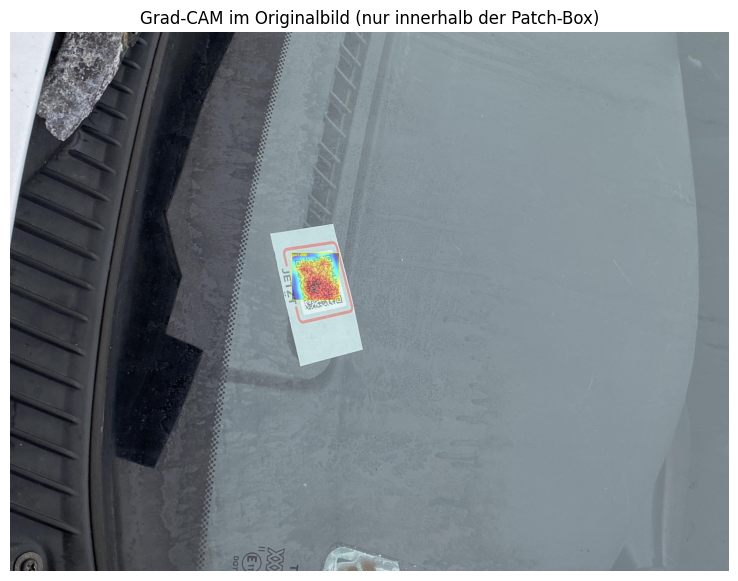

In [26]:
# =========================
# Grad-CAM (robust) für QR-Patches
# Fix für "view size is not compatible..." durch:
# - CAM auf CPU
# - Contiguous-Hook am letzten AdaptivePool
# - contiguous() auf activations/gradients
# =========================

import torch
import torch.nn as nn
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# ---- Voraussetzungen prüfen ----
required = ["img_bgr", "centers", "patches", "probs_all", "roi_cfg", "THRESH", "RUN_DIRNAME", "REPO_ROOT", "pgr"]
missing = [k for k in required if k not in globals()]
if missing:
    raise RuntimeError(f"Bitte zuerst die vorherigen Zellen ausführen. Fehlend: {missing}")

# -----------------------------
# 1) Run finden (aus runs/cnn_scratch) und zusätzlich ein CPU-Model laden
# -----------------------------
RUNS_DIR = Path(REPO_ROOT) / "runs" / "cnn_scratch"
ALL_RUNS = pgr.discover_runs(RUNS_DIR)

run_sel = None
for r in ALL_RUNS:
    if r.run_dir.name == RUN_DIRNAME:
        run_sel = r
        break
if run_sel is None:
    raise ValueError(f"Run nicht gefunden: {RUN_DIRNAME} in {RUNS_DIR}")

# Wir laden ein separates Modell auf CPU für Grad-CAM (robuster als MPS/CUDA)
loaded_cam = pgr.load_model_from_run(run_sel, device_str="cpu")
model_cam = loaded_cam.model
model_cam.eval()

print("Grad-CAM uses model (CPU):", run_sel.run_dir.name)
print("kind:", loaded_cam.kind, "| input_size:", loaded_cam.input_size)

# -----------------------------
# 2) QR-Patches auswählen (p >= THRESH)
# -----------------------------
ps = int(roi_cfg.patch_size)
half = ps // 2
H, W = img_bgr.shape[:2]

qr_indices = [i for i, p in enumerate(probs_all) if float(p) >= float(THRESH)]
if not qr_indices:
    raise RuntimeError(f"Keine QR-Patches gefunden mit p >= {THRESH}. (THRESH senken oder anderes Bild)")

qr_indices = sorted(qr_indices, key=lambda i: float(probs_all[i]), reverse=True)

NUM_SHOW = min(6, len(qr_indices))
print(f"QR-patches: {len(qr_indices)} | showing top {NUM_SHOW}")

# -----------------------------
# 3) Helper: Ziel-Layer finden (letzte Conv2d) + Contiguous-Hook am letzten AdaptivePool
# -----------------------------
def find_last_conv2d(m: nn.Module):
    last = None
    for name, layer in m.named_modules():
        if isinstance(layer, nn.Conv2d):
            last = (name, layer)
    if last is None:
        raise RuntimeError("Keine Conv2d Layer gefunden. Grad-CAM benötigt Conv-Featuremaps.")
    return last

def find_last_adaptive_pool(m: nn.Module):
    last = None
    for name, layer in m.named_modules():
        if isinstance(layer, (nn.AdaptiveAvgPool2d, nn.AdaptiveMaxPool2d)):
            last = (name, layer)
    return last

layer_name, target_layer = find_last_conv2d(model_cam)
pool = find_last_adaptive_pool(model_cam)

print("Grad-CAM target conv layer:", layer_name)
if pool:
    print("Last adaptive pool:", pool[0])
else:
    print("No AdaptivePool found (ok for some nets).")

# Hook: mache Pool-Output contiguous, damit flatten/view nicht crasht
pool_hook_handle = None
if pool:
    def _pool_out_contig(module, inp, out):
        if isinstance(out, torch.Tensor):
            return out.contiguous()
        return out
    pool_hook_handle = pool[1].register_forward_hook(_pool_out_contig)

# -----------------------------
# 4) Grad-CAM Engine (mit contiguous activations/gradients)
# -----------------------------
class GradCAM:
    def __init__(self, model: nn.Module, target_layer: nn.Module):
        self.model = model
        self.target_layer = target_layer
        self.activations = None
        self.gradients = None

        def fwd_hook(module, inp, out):
            self.activations = out

        def bwd_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0]

        self.h1 = target_layer.register_forward_hook(fwd_hook)
        self.h2 = target_layer.register_full_backward_hook(bwd_hook)

    def close(self):
        self.h1.remove()
        self.h2.remove()

    def __call__(self, x: torch.Tensor) -> np.ndarray:
        # x: (1,3,H,W) on CPU
        self.model.zero_grad(set_to_none=True)

        # wichtig: contiguous input (falls irgendwas upstream non-contig ist)
        x = x.contiguous()

        y = self.model(x)

        # robustes Target: SUM statt einzelnes Element (vermeidet manche stride/view-Edgecases)
        if y.ndim == 1:
            target = y.sum()
        elif y.ndim == 2 and y.shape[1] == 1:
            target = y[:, 0].sum()
        elif y.ndim == 2 and y.shape[1] == 2:
            target = y[:, 1].sum()
        else:
            target = y.reshape(y.shape[0], -1)[:, 0].sum()

        target.backward(retain_graph=False)

        if self.activations is None or self.gradients is None:
            raise RuntimeError("Hooks haben keine Activations/Gradients geliefert.")

        act = self.activations
        grad = self.gradients

        # Make safe for any view/stride assumptions downstream
        act = act.contiguous()
        grad = grad.contiguous()

        weights = grad.mean(dim=(2, 3), keepdim=True)  # (1,C,1,1)
        cam = (weights * act).sum(dim=1)               # (1,h,w)
        cam = torch.relu(cam)[0]

        cam = cam.detach().float().cpu().numpy()
        cam -= cam.min()
        cam /= (cam.max() + 1e-8)
        return cam.astype(np.float32)

def overlay_cam_on_patch(patch_bgr: np.ndarray, cam01: np.ndarray, alpha: float = 0.45) -> np.ndarray:
    heat_u8 = (cam01 * 255).astype(np.uint8)
    heat_bgr = cv2.applyColorMap(heat_u8, cv2.COLORMAP_JET)
    out = cv2.addWeighted(heat_bgr, alpha, patch_bgr, 1.0 - alpha, 0.0)
    return out

def paste_cam_into_original(img_bgr: np.ndarray, box, cam01_patch: np.ndarray, alpha: float = 0.45) -> np.ndarray:
    x0, y0, x1, y1 = box
    roi = img_bgr[y0:y1, x0:x1].copy()
    cam_resized = cv2.resize(cam01_patch, (roi.shape[1], roi.shape[0]), interpolation=cv2.INTER_LINEAR)
    heat_u8 = (cam_resized * 255).astype(np.uint8)
    heat_bgr = cv2.applyColorMap(heat_u8, cv2.COLORMAP_JET)
    blended = cv2.addWeighted(heat_bgr, alpha, roi, 1.0 - alpha, 0.0)
    out = img_bgr.copy()
    out[y0:y1, x0:x1] = blended
    return out

cam_engine = GradCAM(model_cam, target_layer)

# -----------------------------
# 5) CAM berechnen + Outputs
# -----------------------------
try:
    for rank in range(NUM_SHOW):
        i = qr_indices[rank]
        p = float(probs_all[i])

        patch_bgr = patches[i]
        cx, cy = int(centers[i]["cx"]), int(centers[i]["cy"])
        x0, y0 = cx - half, cy - half
        x1, y1 = x0 + ps, y0 + ps
        x0, y0, x1, y1 = pgr.clamp_box(x0, y0, x1, y1, W, H)
        box = (x0, y0, x1, y1)

        # Tensor (CPU) – nutze dieselbe Preprocess-Funktion, aber device=cpu
        x = pgr.patches_to_tensor([patch_bgr], loaded_cam.input_size, loaded_cam.mean, loaded_cam.std, device=torch.device("cpu"))

        # CAM (feature space) -> patch size
        cam_feat = cam_engine(x)  # (h_feat, w_feat)
        cam_patch = cv2.resize(cam_feat, (patch_bgr.shape[1], patch_bgr.shape[0]), interpolation=cv2.INTER_LINEAR)

        patch_overlay = overlay_cam_on_patch(patch_bgr, cam_patch, alpha=0.45)
        orig_with_cam = paste_cam_into_original(img_bgr, box, cam_patch, alpha=0.45)

        # Box + p label
        orig_with_cam = cv2.rectangle(orig_with_cam.copy(), (x0, y0), (x1, y1), (0, 255, 255), 2)
        cv2.putText(orig_with_cam, f"p={p:.3f}", (x0+3, max(18, y0+18)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 255), 2, cv2.LINE_AA)

        print(f"\nPatch rank #{rank} | idx={i} | p={p:.4f} | center=({cx},{cy}) | box={box}")

        # Patch original / overlay
        plt.figure(figsize=(14, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(patch_bgr, cv2.COLOR_BGR2RGB))
        plt.title(f"Patch #{rank} (orig)  p={p:.3f}")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(patch_overlay, cv2.COLOR_BGR2RGB))
        plt.title(f"Grad-CAM Overlay (layer={layer_name})")
        plt.axis("off")
        plt.show()

        # Kontext im Original
        plt.figure(figsize=(12, 7))
        plt.imshow(cv2.cvtColor(orig_with_cam, cv2.COLOR_BGR2RGB))
        plt.title("Grad-CAM im Originalbild (nur innerhalb der Patch-Box)")
        plt.axis("off")
        plt.show()

finally:
    cam_engine.close()
    if pool_hook_handle is not None:
        pool_hook_handle.remove()
